In [28]:
import pandas as pd
import numpy as np
import os 
from SSA import SSA_H_Plus
from FeatureExtractor import FeatureExtractor 
import scipy.io as sio
from statistics import mean 
from collections.abc import Iterable
import json
from math import sqrt 
from torch import nn
import torch
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [14]:
annotations=pd.read_csv('data-set/cars/cardatasettrain.csv')
annotations

,Unnamed: 0,x1,y1,x2,y2,Class,image
0,0,39,116,569,375,14,00001.jpg
1,1,36,116,868,587,3,00002.jpg
2,2,85,109,601,381,91,00003.jpg
3,3,621,393,1484,1096,134,00004.jpg
4,4,14,36,133,99,106,00005.jpg
...,...,...,...,...,...,...,...
8139,8139,3,44,423,336,78,08140.jpg
8140,8140,138,150,706,523,196,08141.jpg
8141,8141,26,246,660,449,163,08142.jpg
8142,8142,78,526,1489,908,112,08143.jpg


In [15]:
image_classes=annotations[['Class','image']]
image_classes

,Class,image
0,14,00001.jpg
1,3,00002.jpg
2,91,00003.jpg
3,134,00004.jpg
4,106,00005.jpg
...,...,...
8139,78,08140.jpg
8140,196,08141.jpg
8141,163,08142.jpg
8142,112,08143.jpg


In [19]:
train_data=image_classes.sample(frac=0.9,random_state=200)
test_data=image_classes.drop(train_data.index)

In [20]:
train_data

,Class,image
7309,80,07310.jpg
2796,12,02797.jpg
3230,72,03231.jpg
716,106,00717.jpg
3419,90,03420.jpg
...,...,...
2249,188,02250.jpg
4560,129,04561.jpg
5786,18,05787.jpg
6245,125,06246.jpg


In [21]:
test_data

,Class,image
17,73,00018.jpg
67,122,00068.jpg
76,110,00077.jpg
106,131,00107.jpg
111,137,00112.jpg
...,...,...
8068,155,08069.jpg
8075,105,08076.jpg
8094,45,08095.jpg
8098,116,08099.jpg


In [22]:
fe=FeatureExtractor() 
image_paths = []  
image_folder = os.getcwd()+'/data-set/cars/cars_train/cars_train'

Just once for saving Features:

In [23]:
all_classes=[]
all_ssa=[]
all_images=[]
for record in train_data.values:
    all_classes.append(record[0])
    all_images.append(record[1])
    img_path=image_folder+'/'+record[1]
    feature=fe.extract(img_path)
    ssa_plus=SSA_H_Plus(feature) 
    all_ssa.append(ssa_plus)

1/1 [==============================] - 0s 153ms/step


For Save Learned Features:

In [24]:
with open('cached-data/new/cars/img_classes.json', 'w') as f:
    json.dump([str(x) for x in all_classes], f)
with open('cached-data/new/cars/image_names.json', 'w') as f:
    json.dump([str(x) for x in all_images], f)
sio.savemat('cached-data/new/cars/ssa_features_class.mat',{'ssa_features':all_ssa})

for reading all features:

In [10]:
all_ssa=sio.loadmat('cached-data/new/cars/ssa_features_class.mat')['ssa_features']
f = open('cached-data/new/cars/img_classes.json')
all_classes = json.load(f)
f = open('cached-data/new/cars/image_names.json')
all_images = json.load(f)

1/1 [==============================] - 0s 169ms/step


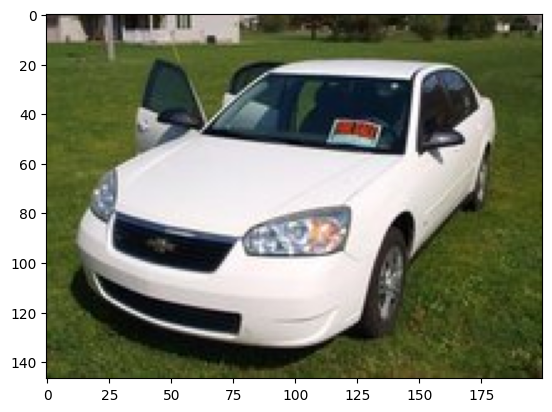

input: 73
predicted 1: 65


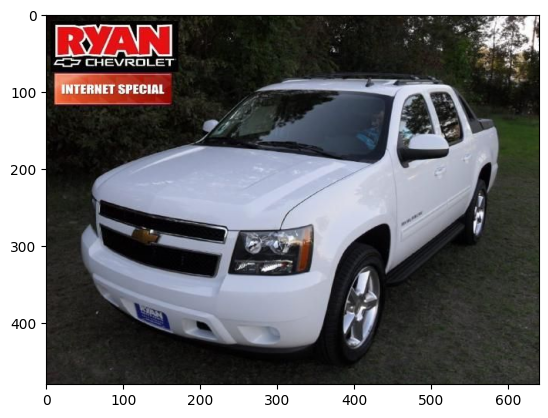

predicted 2: 129


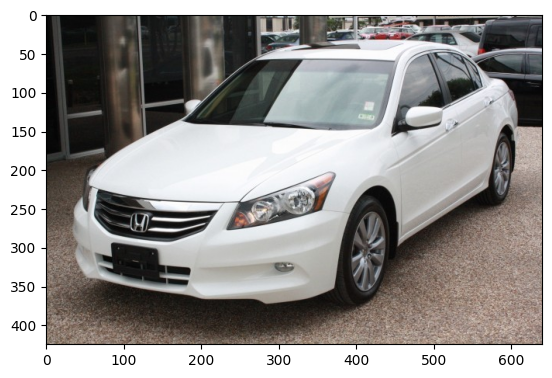

predicted 3: 3


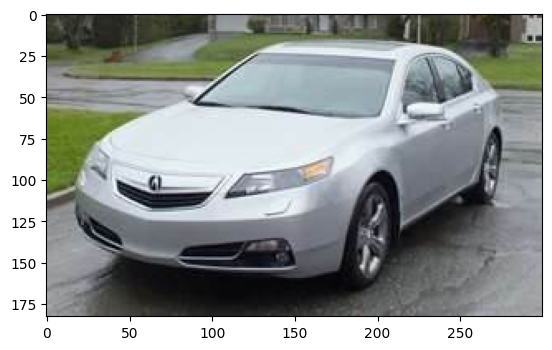

predicted 4: 130


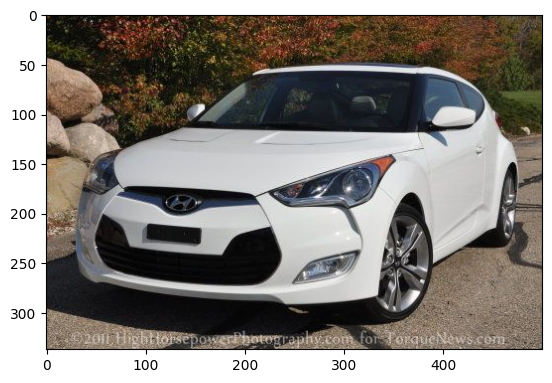

predicted 5: 154


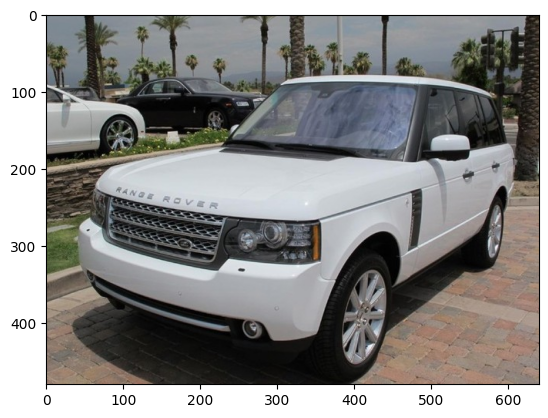

Count of TRUTE: 0
-------------------------
1/1 [==============================] - 0s 144ms/step


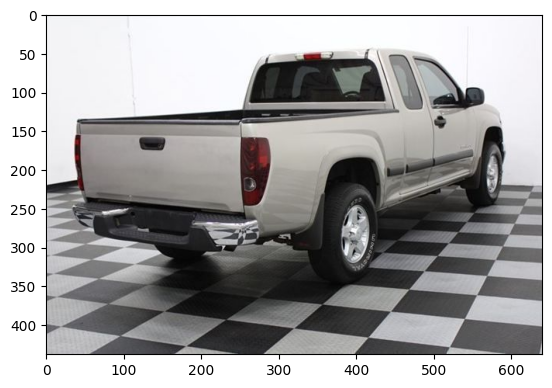

input: 122
predicted 1: 32


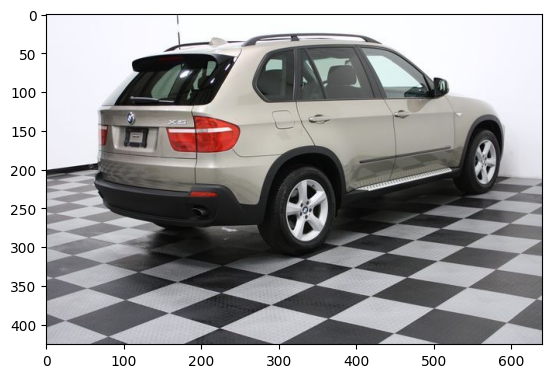

predicted 2: 73


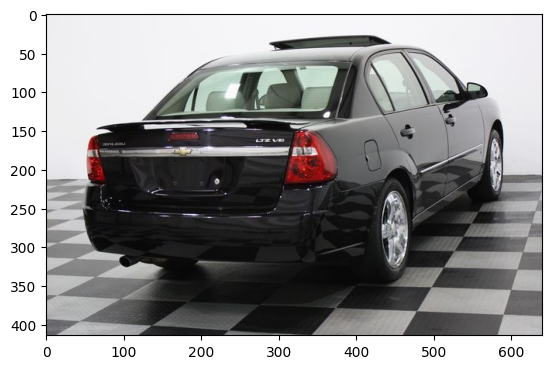

predicted 3: 69


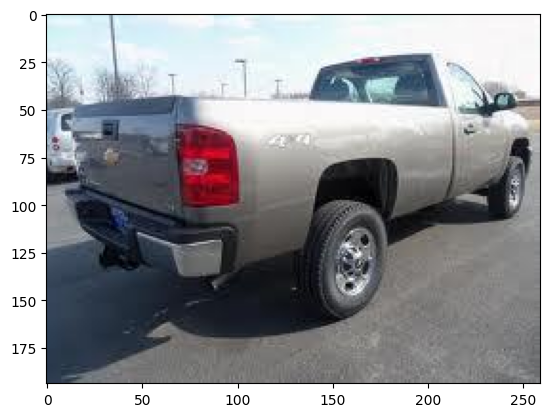

predicted 4: 106


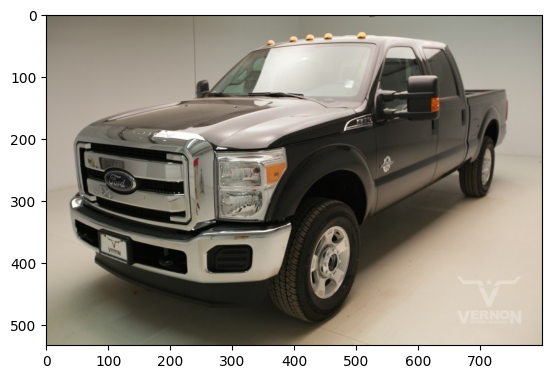

predicted 5: 17


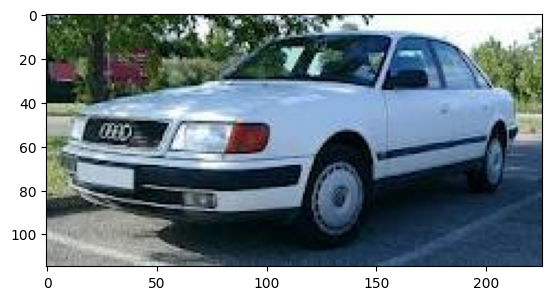

Count of TRUTE: 0
-------------------------
1/1 [==============================] - 0s 167ms/step


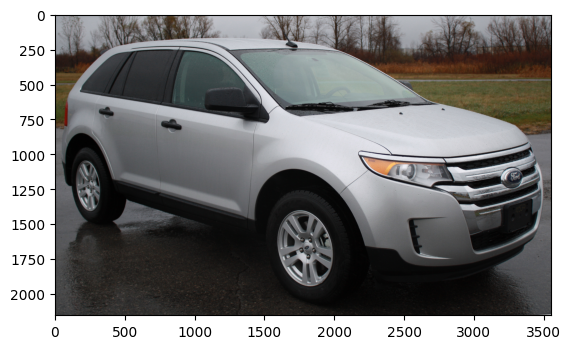

input: 110
predicted 1: 129


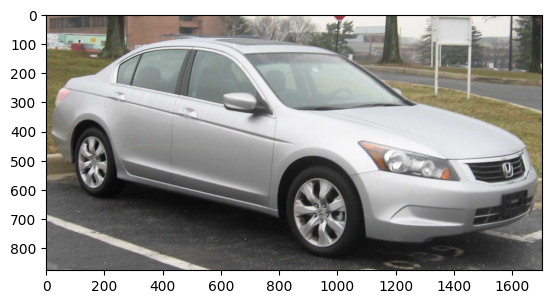

predicted 2: 167


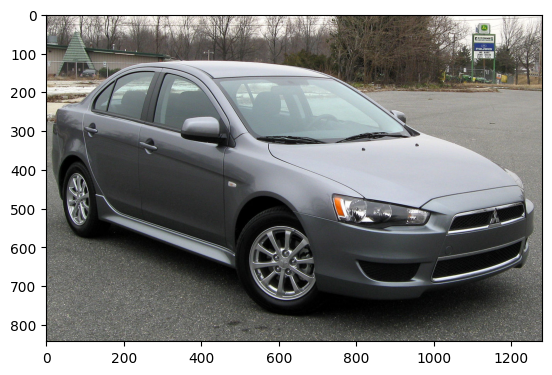

predicted 3: 78


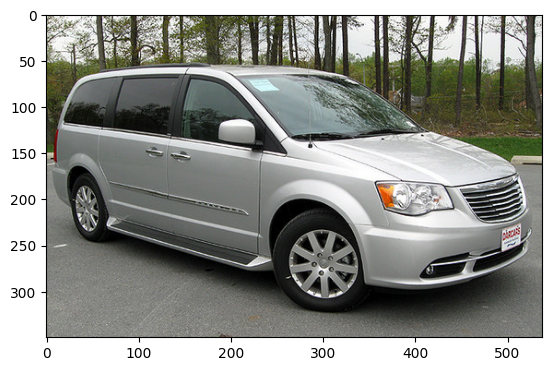

predicted 4: 76


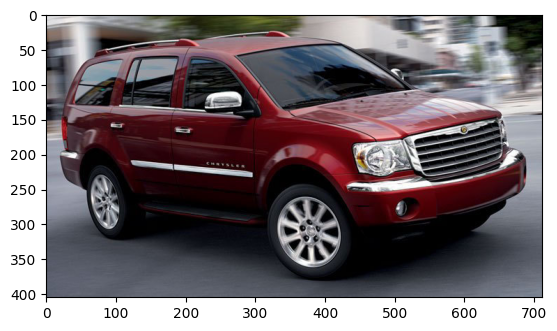

predicted 5: 142


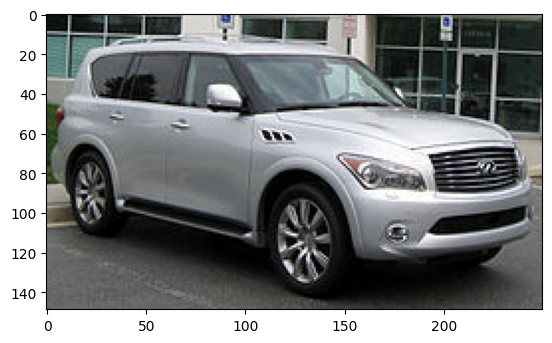

Count of TRUTE: 0
-------------------------
1/1 [==============================] - 0s 181ms/step


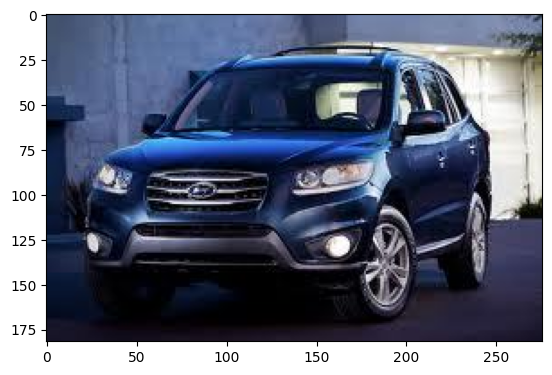

input: 131
predicted 1: 135


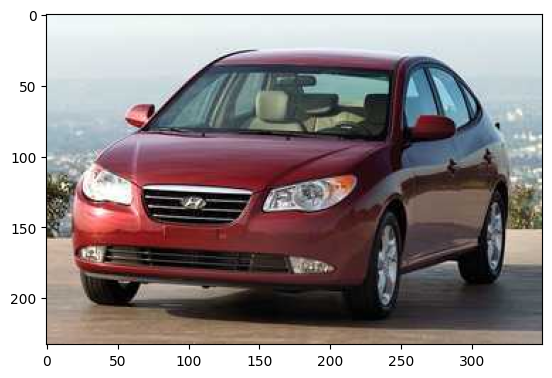

predicted 2: 190


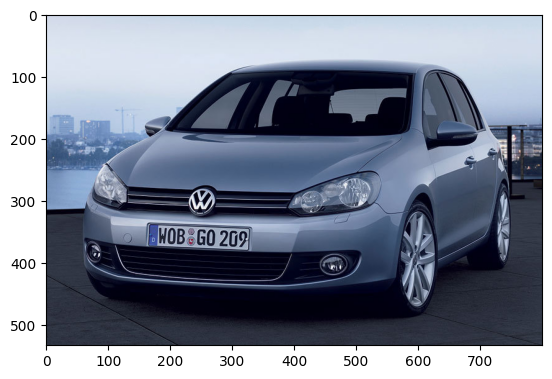

predicted 3: 111


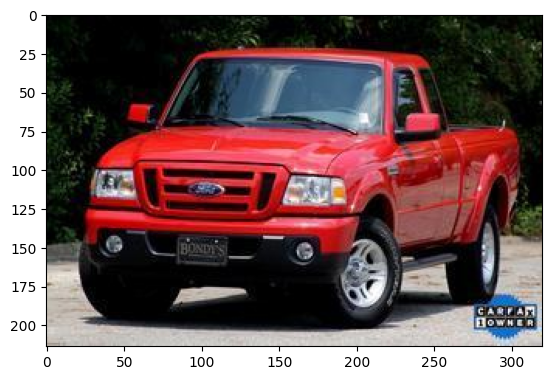

predicted 4: 33


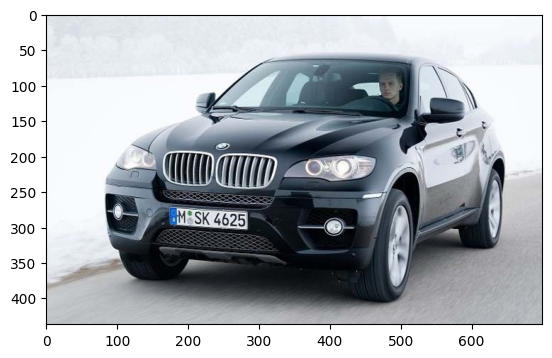

predicted 5: 60


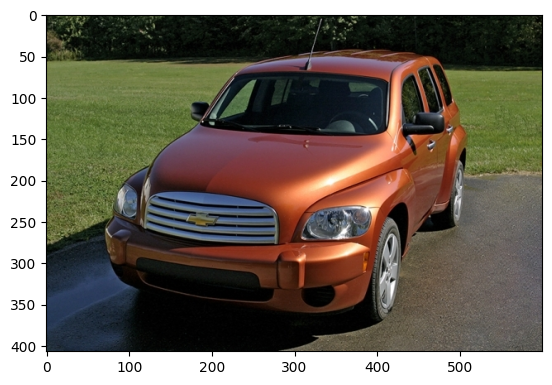

Count of TRUTE: 0
-------------------------
1/1 [==============================] - 0s 170ms/step


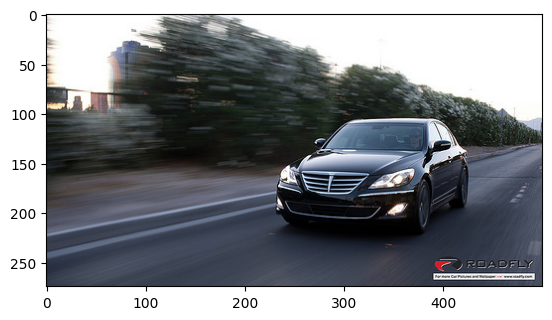

input: 137
predicted 1: 10


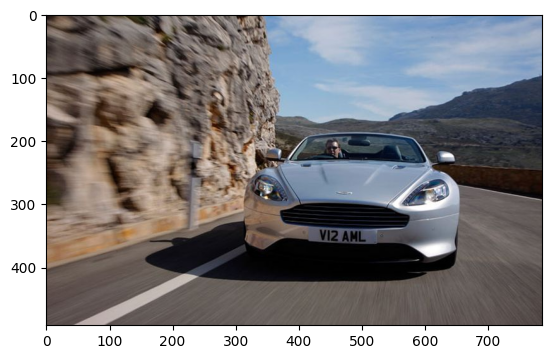

predicted 2: 164


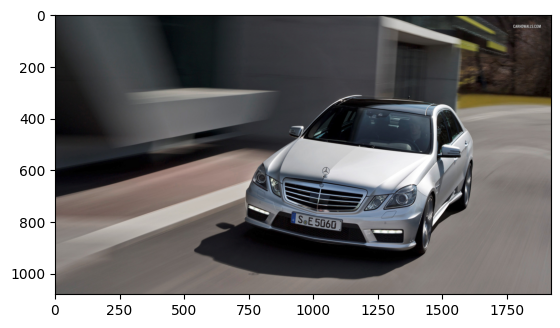

predicted 3: 37


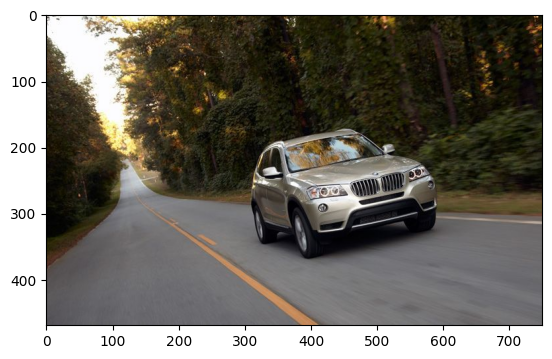

predicted 4: 29


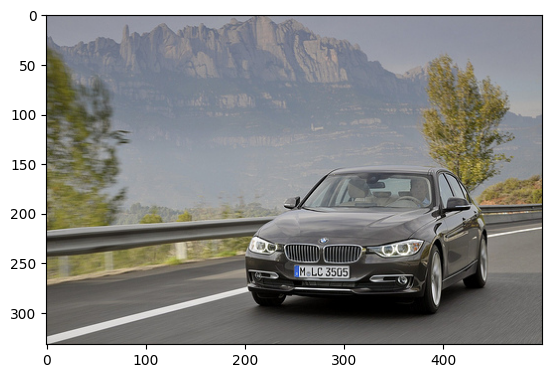

predicted 5: 26


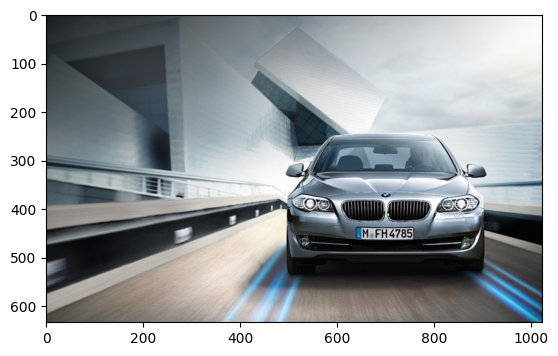

Count of TRUTE: 0
-------------------------
1/1 [==============================] - 0s 243ms/step


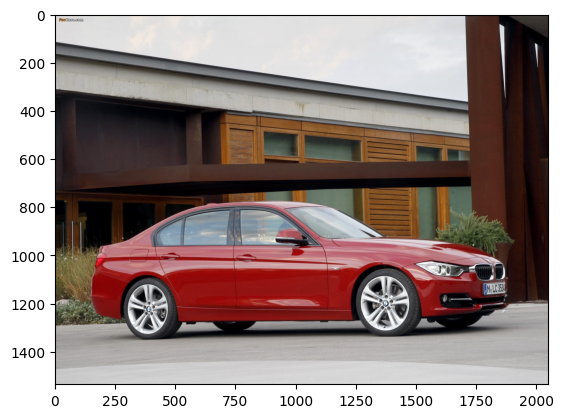

input: 29
predicted 1: 21


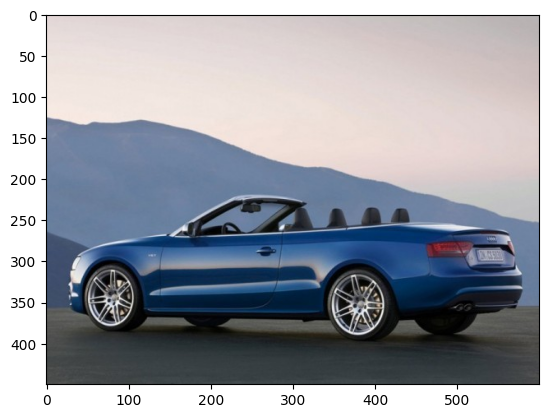

predicted 2: 21


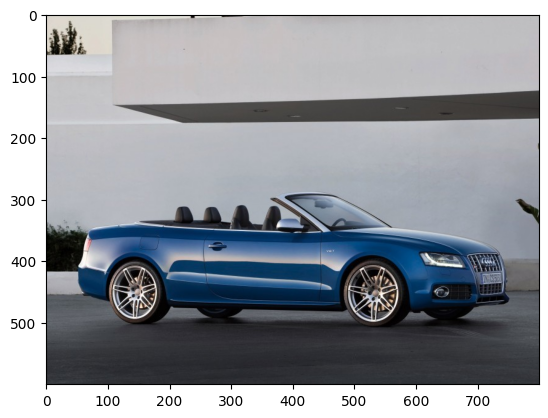

predicted 3: 34


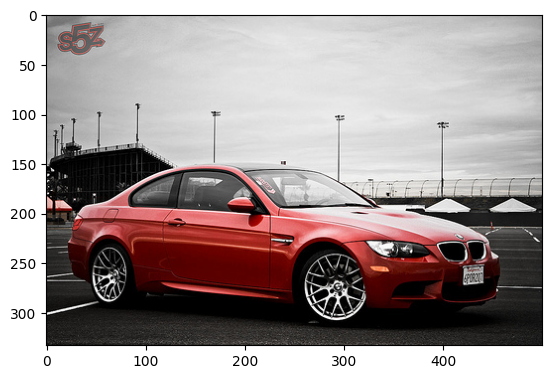

predicted 4: 79


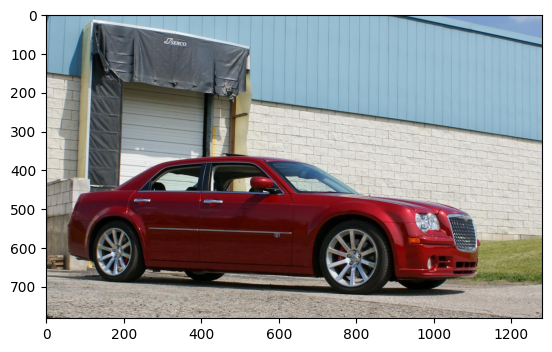

predicted 5: 136


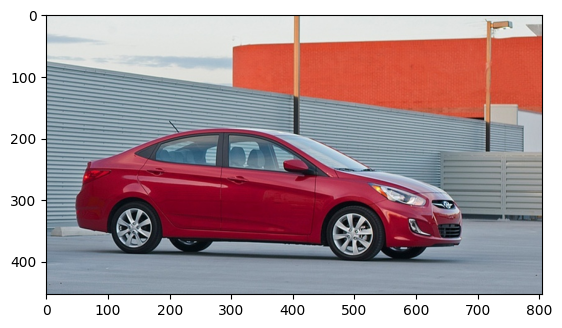

Count of TRUTE: 0
-------------------------
1/1 [==============================] - 0s 307ms/step


In [31]:
loss = nn.CrossEntropyLoss()
count_of_tested=0
for test in test_data.values:
    image=test[1]
    input_class=str(test[0])
    img_path=image_folder+'/'+image
    feature=fe.extract(img_path)
    ssa_plus=SSA_H_Plus(feature)
    index=0
    distances=[]
    for train_image in all_images:
        class_ssa=all_ssa[index]
        Class=all_classes[index]
        this_distance= sqrt( sum(np.multiply(class_ssa - ssa_plus,class_ssa - ssa_plus)))
        # this_CE=loss(torch.Tensor(class_ssa),torch.Tensor(ssa_plus))
        distances.append([this_distance,Class,train_image])
        # class_distances.append([this_CE.float(),Class])
        index=index+1
    distances.sort()
    distances=distances[:5]
    img=mpimg.imread(os.getcwd()+'/data-set/cars/cars_train/cars_train/'+image)
    imgplot=plt.imshow(img)
    plt.show() 
    print('input: '+str(input_class))
    prediction_index=1
    count_of_true=0
    for predicted in distances:
        print('predicted '+str(prediction_index)+': '+str(predicted[1]))
        img=mpimg.imread(os.getcwd()+'/data-set/cars/cars_train/cars_train/'+predicted[2])
        imgplot=plt.imshow(img)
        plt.show() 
        prediction_index=prediction_index+1
        if(predicted[1]==input_class):
            count_of_true=count_of_true+1
        
    print('Count of TRUTE: '+str(count_of_true))
    print('-------------------------')
    count_of_tested=count_of_tested+1
    if(count_of_tested>20):
        break
    